In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [3]:
data = pd.read_csv('sales.csv')
data

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,32298,CA-2012-124891,31/7/2012,31/7/2012,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,TEC-AC-10003033,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,26341,IN-2013-77878,5/2/2013,7/2/2013,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,FUR-CH-10003950,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,25330,IN-2013-71249,17/10/2013,18/10/2013,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,TEC-PH-10004664,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,13524,ES-2013-1579342,28/1/2013,30/1/2013,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,TEC-PH-10004583,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,47221,SG-2013-4320,5/11/2013,6/11/2013,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,TEC-SHA-10000501,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,29002,IN-2014-62366,19/6/2014,19/6/2014,Same Day,KE-16420,Katrina Edelman,Corporate,Kure,Hiroshima,...,OFF-FA-10000746,Office Supplies,Fasteners,"Advantus Thumb Tacks, 12 Pack",65.100,5,0.0,4.5000,0.01,Medium
51286,35398,US-2014-102288,20/6/2014,24/6/2014,Standard Class,ZC-21910,Zuschuss Carroll,Consumer,Houston,Texas,...,OFF-AP-10002906,Office Supplies,Appliances,Hoover Replacement Belt for Commercial Guardsm...,0.444,1,0.8,-1.1100,0.01,Medium
51287,40470,US-2013-155768,2/12/2013,2/12/2013,Same Day,LB-16795,Laurel Beltran,Home Office,Oxnard,California,...,OFF-EN-10001219,Office Supplies,Envelopes,"#10- 4 1/8"" x 9 1/2"" Security-Tint Envelopes",22.920,3,0.0,11.2308,0.01,High
51288,9596,MX-2012-140767,18/2/2012,22/2/2012,Standard Class,RB-19795,Ross Baird,Home Office,Valinhos,São Paulo,...,OFF-BI-10000806,Office Supplies,Binders,"Acco Index Tab, Economy",13.440,2,0.0,2.4000,0.00,Medium


In [4]:
data['Order Date'] = pd.to_datetime(data['Order Date'])
data['Ship Date'] = pd.to_datetime(data['Ship Date'])

C:\Users\Aditya Kudva\AppData\Local\Temp\ipykernel_31052\2887490760.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data['Order Date'] = pd.to_datetime(data['Order Date'])
C:\Users\Aditya Kudva\AppData\Local\Temp\ipykernel_31052\2887490760.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  data['Ship Date'] = pd.to_datetime(data['Ship Date'])


In [5]:
data['Order Year'] = data['Order Date'].dt.year
data['Order Month'] = data['Order Date'].dt.month

In [6]:
features = ['Order Year', 'Order Month', 'Ship Mode', 'Segment', 'Market', 'Region', 'Category', 'Sub-Category', 'Quantity', 'Discount', 'Shipping Cost', 'Order Priority']
X = pd.get_dummies(data[features])  # Convert categorical variables into dummy/indicator variables.
y = data['Sales']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
X_train, X_test, y_train, y_test

(       Order Year  Order Month  Quantity  Discount  Shipping Cost  \
 33162        2012            6         9     0.000           4.21   
 42206        2014           11         5     0.000           1.77   
 25603        2012            5         4     0.000           7.82   
 28126        2013            7         2     0.200           6.41   
 17208        2014            1         3     0.100          16.05   
 ...           ...          ...       ...       ...            ...   
 11284        2013            9         2     0.500          28.64   
 44732        2012            4         2     0.500           1.28   
 38158        2014            4         3     0.000           2.69   
 860          2012            6         4     0.002         219.53   
 15795        2012            7         2     0.000          18.30   
 
        Ship Mode_First Class  Ship Mode_Same Day  Ship Mode_Second Class  \
 33162                      0                   0                       0   
 422

In [8]:
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [9]:
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2:.2f}')

Mean Squared Error: 62981.46
R^2 Score: 0.71


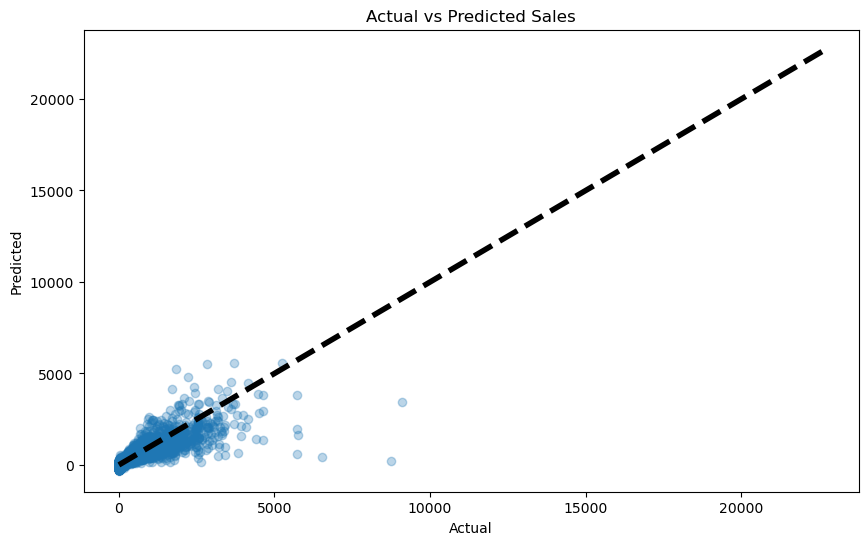

In [10]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted Sales')
plt.show()

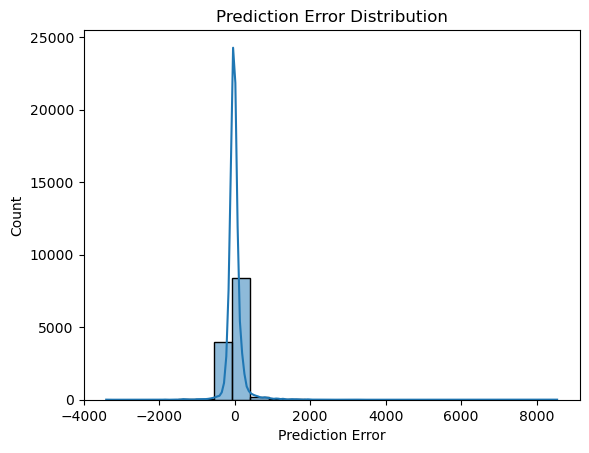

In [11]:
errors = y_test - y_pred
sns.histplot(errors, bins=25, kde=True)
plt.xlabel('Prediction Error')
plt.title('Prediction Error Distribution')
plt.show()

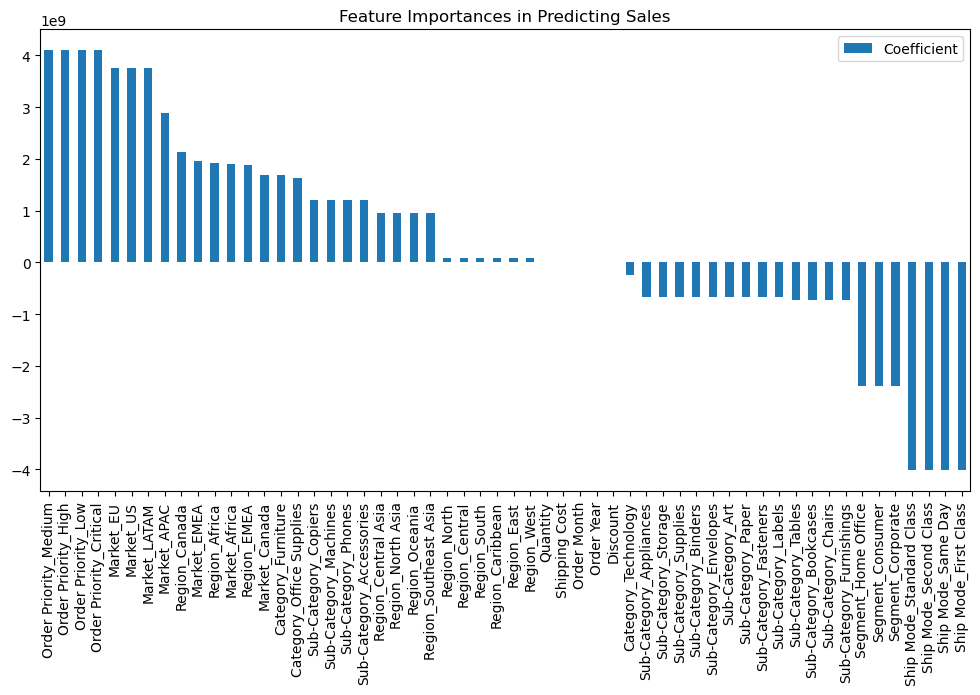

In [12]:
feature_importance = pd.DataFrame(model.coef_, index=X.columns, columns=['Coefficient'])
feature_importance.sort_values(by='Coefficient', ascending=False, inplace=True)
feature_importance.plot(kind='bar', figsize=(12, 6))
plt.title('Feature Importances in Predicting Sales')
plt.show()

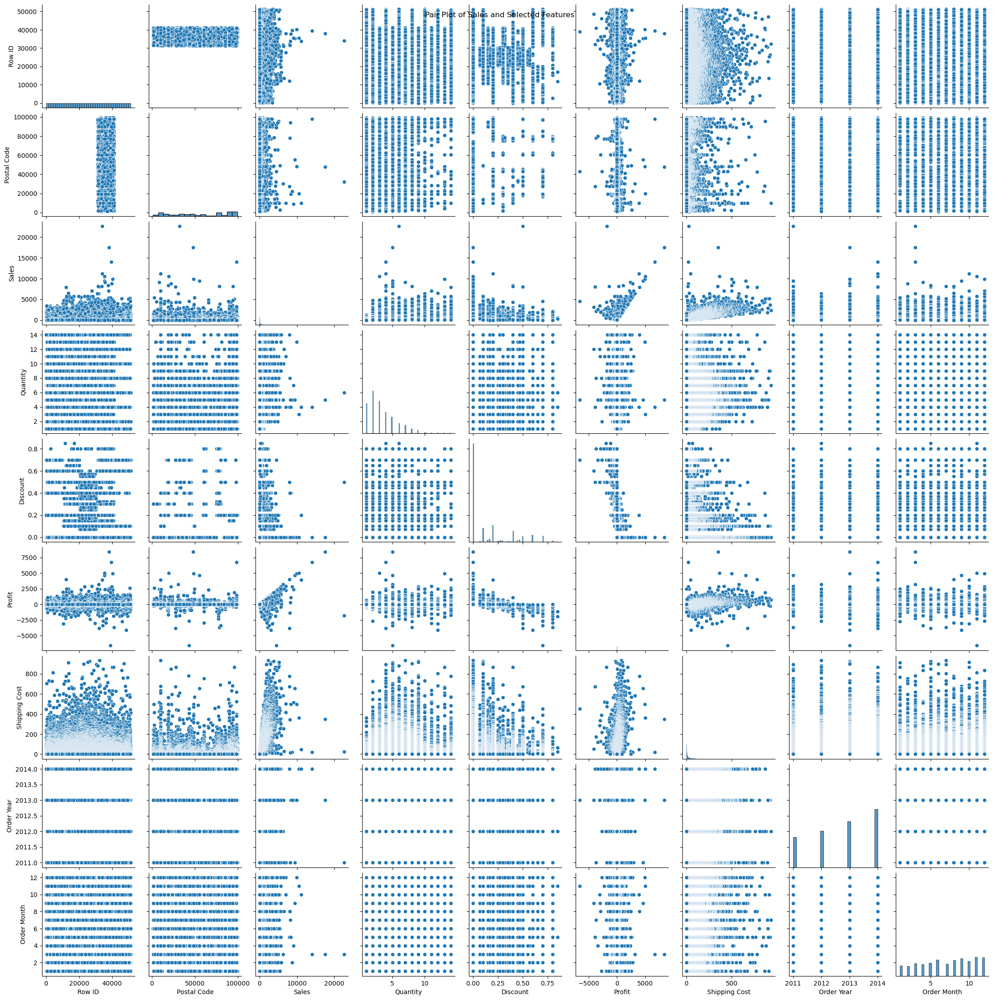

In [13]:
sns.pairplot(data)
plt.suptitle('Pair Plot of Sales and Selected Features', verticalalignment='top')
plt.show()

In [14]:
correlation_matrix = data[['Sales', 'Quantity', 'Discount', 'Shipping Cost']].corr()
correlation_matrix

,Sales,Quantity,Discount,Shipping Cost
Sales,1.000000,0.313577,-0.086722,0.768073
Quantity,0.313577,1.000000,-0.019875,0.272649
Discount,-0.086722,-0.019875,1.000000,-0.079056
Shipping Cost,0.768073,0.272649,-0.079056,1.000000


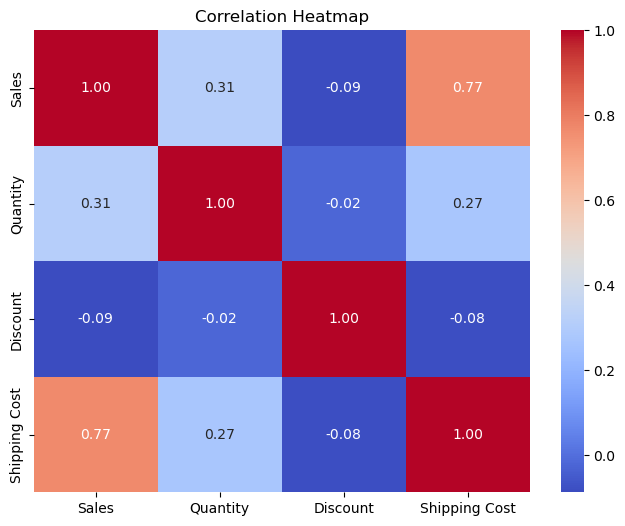

In [15]:
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [16]:
import plotly.express as px

In [17]:
fig = px.line(data, x='Order Date', y='Sales', title='Sales Over Time', labels={'Sales': 'Sales ($)', 'Order Date': 'Date'})
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [18]:
from sklearn.ensemble import RandomForestRegressor


In [19]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [20]:
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

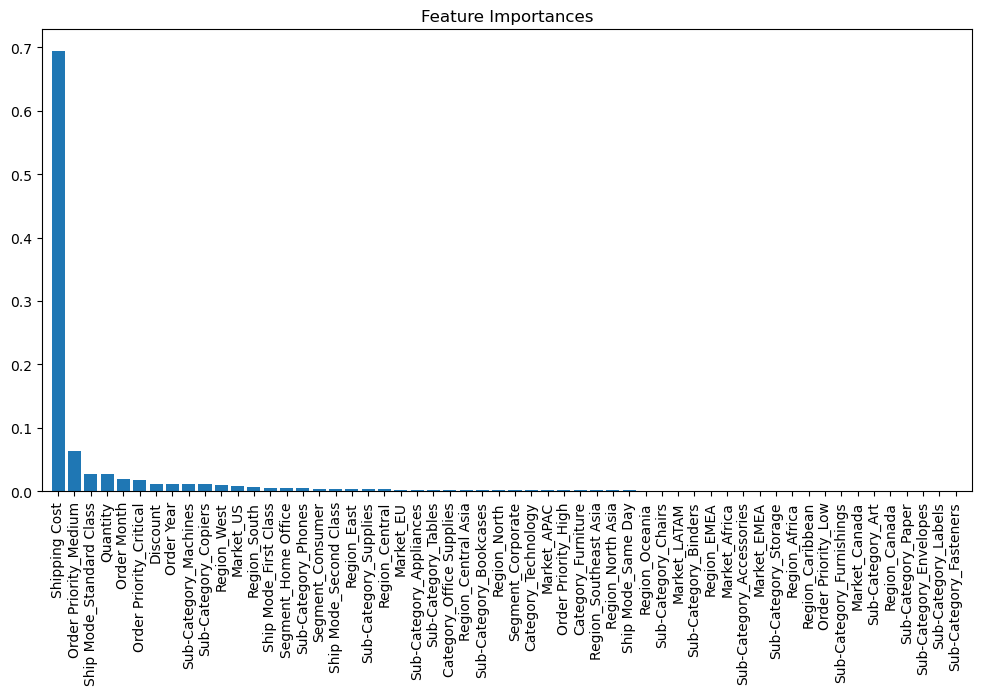

In [21]:
plt.figure(figsize=(12, 6))
plt.title('Feature Importances')
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [22]:
residuals = y_test - y_pred
residuals

49728   -22.035868
45547    92.248218
15664    43.484829
40561   -34.142389
49426    43.925078
           ...    
46156    55.910974
18754   -43.388948
29983   -32.241150
24864   -84.280607
12001    73.362399
Name: Sales, Length: 12823, dtype: float64

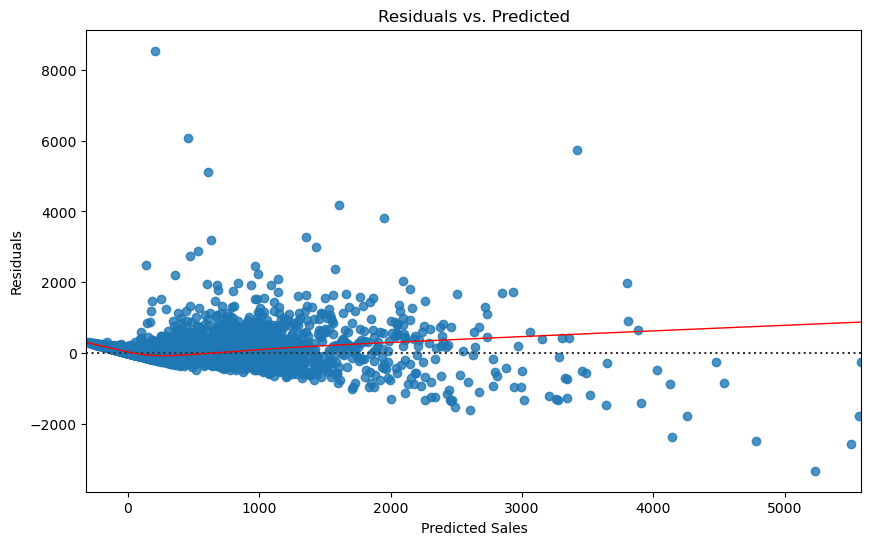

In [23]:
plt.figure(figsize=(10, 6))
sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
plt.title('Residuals vs. Predicted')
plt.xlabel('Predicted Sales')
plt.ylabel('Residuals')
plt.show()
